# Figure 5: Denmark Strait freshwater transport adjoint sensitivities

This notebook will reproduce Figure 5 from  E. Boland et al. 2025 (doi to come). This requires input datafiles (expects to find them in ../data_out) to run - please see the README for details.

Please attribute any plots or code from this notebook using the DOI from Zenodo: TO COME

E Boland Jan 2025 [emmomp@bas.ac.uk](email:emmomp@bas.ac.uk)

In [1]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import sys
sys.path.insert(0,'/users/emmomp/Python/ECCOv4-py')
import ecco_v4_py as ecco
import cartopy.crs as ccrs
import utils as ut

In [2]:
ecco_grid=xr.open_dataset('~/data/orchestra/other_data/ECCO_r3_alt/ECCOv4r3_grid.nc') 
rootdir='/users/emmomp/data/canari/experiments/'
griddir = '/users/emmomp/data/orchestra/grid2/'
eyears=[2000,2006,2014]
mths=['Mar','Jun','Sep','Dec']
mth_i=[3,6,9,12]
imth={'Mar':3,'Jun':6,'Sep':9,'Dec':12}
adj_freq=604800
nt=260
adj_vars=['adxx_qnet','adxx_empmr','adxx_tauu','adxx_tauv']

lags=[0,-0.25,-0.5,-1.5,-4]
lag_labels=['0 to -3m lag','-3m to -6m lag','-6m to -18m lag','-18m to -4 y lag','0 to -4 y lag']

In [3]:
lag_lengths=[lags[i]-lags[i+1] for i in range(0,len(lags)-1)]
lag_lengths=lag_lengths+[4,]

In [4]:
ds_plot_all=[]
for year in eyears:
    ds_plot=xr.open_mfdataset(f'../data_out/ecco_2dconvs_{year}*nc',concat_dim='lag_range',combine='nested')
    ds_plot['exp']=[str(x) for x in ds_plot.exp.data]
    ds_plot_all.append(ds_plot.assign_coords({'eyear':year}))
ds_plot_all=xr.concat(ds_plot_all,'eyear')
ds_plot_all['wind_OCE']=ds_plot_all['adxx_tauuXoceTAUU']+ds_plot_all['adxx_tauvXoceTAUV']

In [5]:
xmin,xmax,ymin,ymax=(-2266791.253073855,
 3358349.2597455736,
 -2166791.253073855,
 3458349.2597455736)
proj_dict={'projection_type':'ortho','user_lon_0':-45,'user_lat_0':70}
my_projn = ccrs.Orthographic(central_longitude=-45,central_latitude=70)
[section_pt1,section_pt2]=ecco.get_section_endpoints('Denmark Strait')
exf_units=dict(zip(adj_vars,['W/m$^2$','m/s','m$^2$/s','m$^2$/s']))
exf_labels=dict(zip(adj_vars+['wind_OCE',],['Net Heat Flux','Net Freshwater Flux','Zonal Wind Stress','Meridional Wind Stress','Wind Stress']))
clims=dict(zip(adj_vars+['wind_OCE',],[[0.6,0.3,0.1,0.05],[3e-4,1e-4,4e-5,1.5e-5],[4,0.8,0.2,0.1],[4,0.8,0.2,0.1],[4,0.8,0.2,0.1]]))

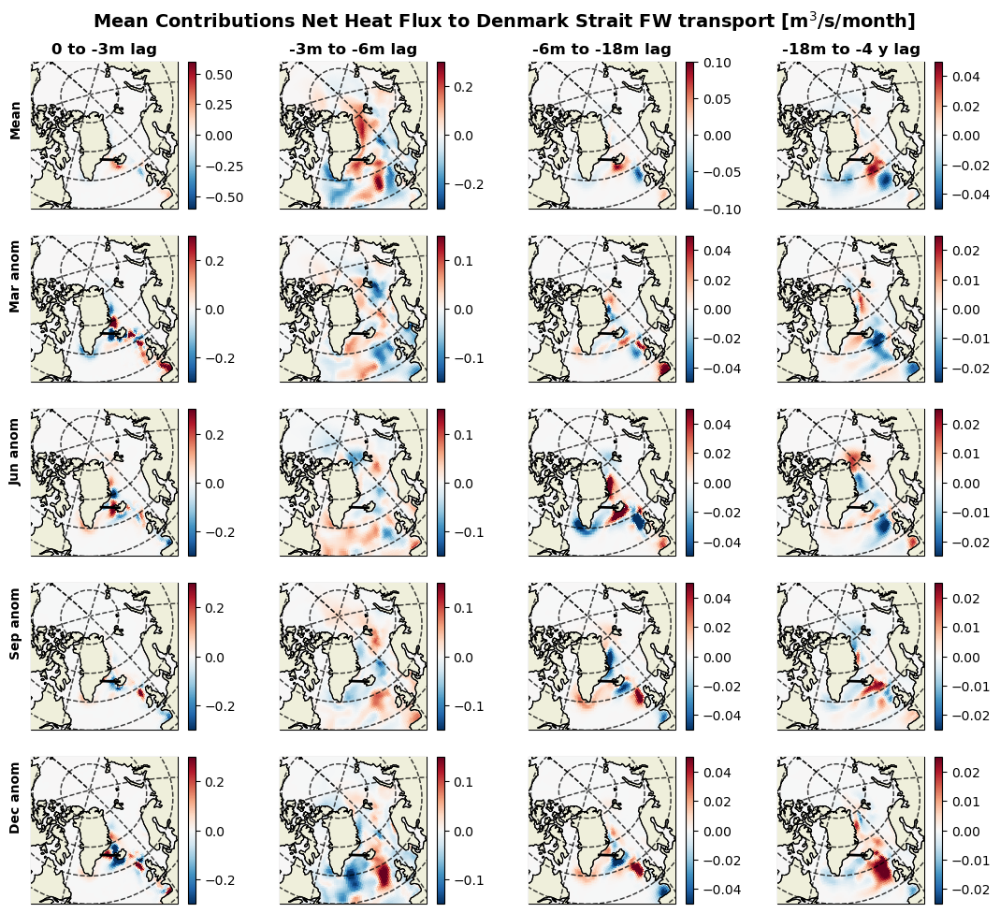

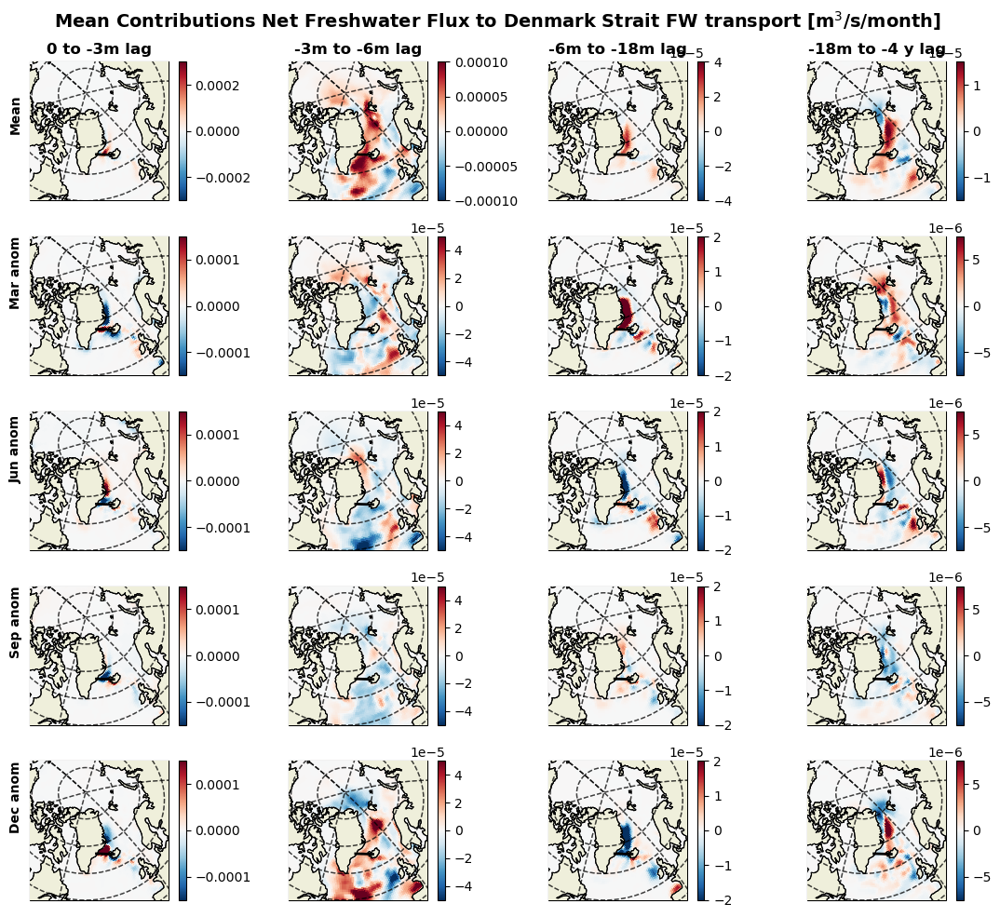

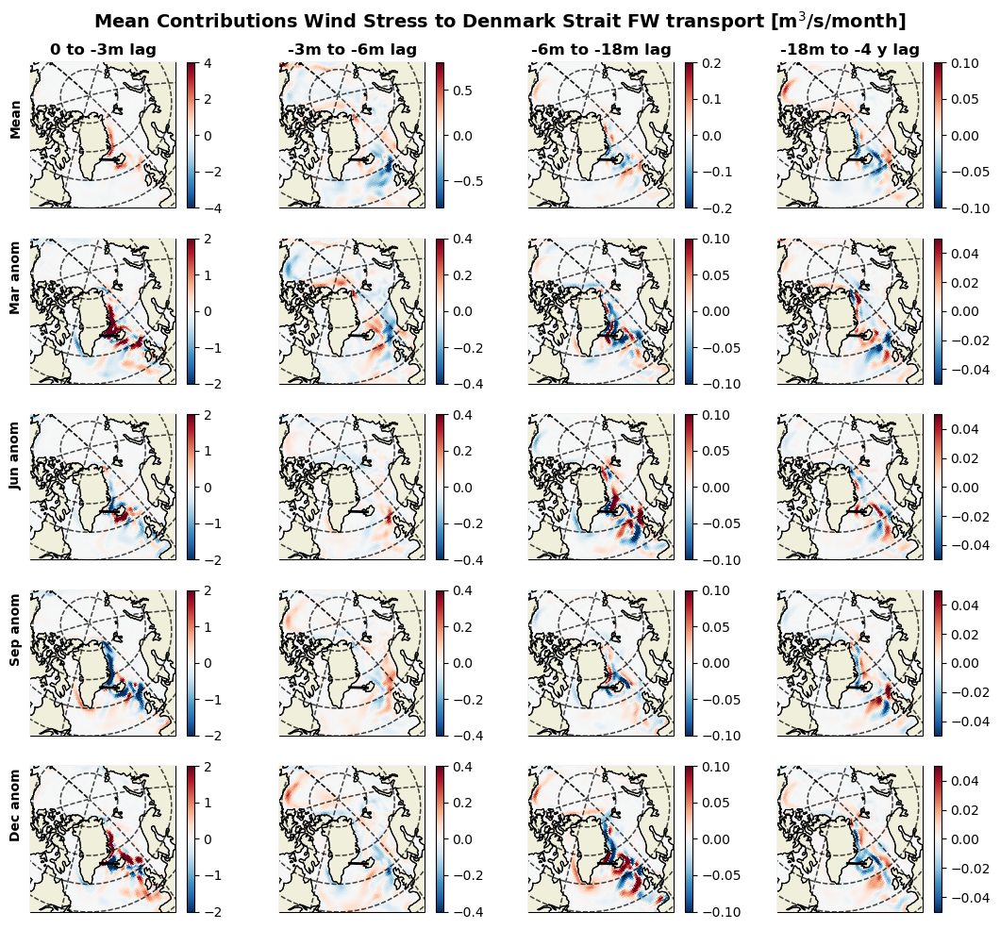

In [23]:
plot_vars=['adxx_qnetXEXFqnet','adxx_empmrXEXFempmr','wind_OCE']
var_label=['adxx_qnet','adxx_empmr','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[11,10])
    pp=1
    mth_mean=ds_plot_all[var].mean(['month','eyear'])
    for ilag in range(0,len(lags)-1):
        [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_mean.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                           **proj_dict,
                           cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                          )
        ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
        ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
             color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
        if pp<5:
            plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
        if ilag==0:
            ax.text(-0.1,0.5,'Mean',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
        pp+=1
    
    for mth in mth_i:
        mth_anom=(ds_plot_all[var].sel(month=mth)-mth_mean).mean('eyear')
        for ilag in range(0,len(lags)-1):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[5,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag]*0.5,cmax=clims[var_label[iv]][ilag]*0.5
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{mths[int(mth/3)-1]} anom',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()

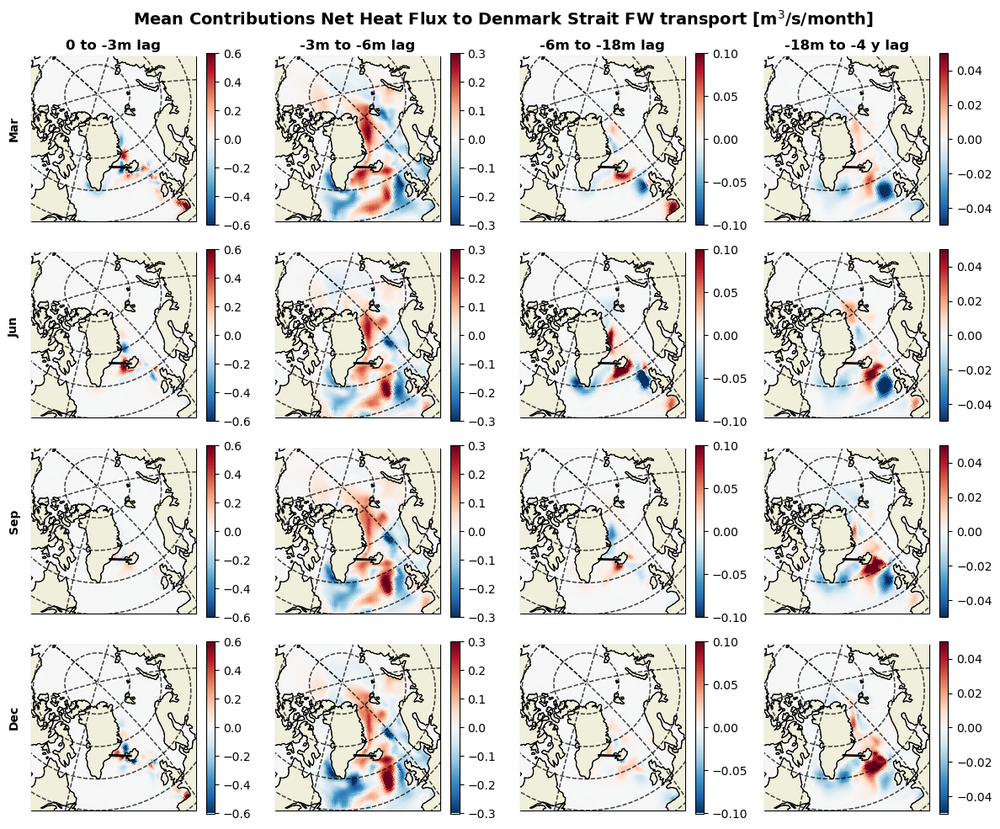

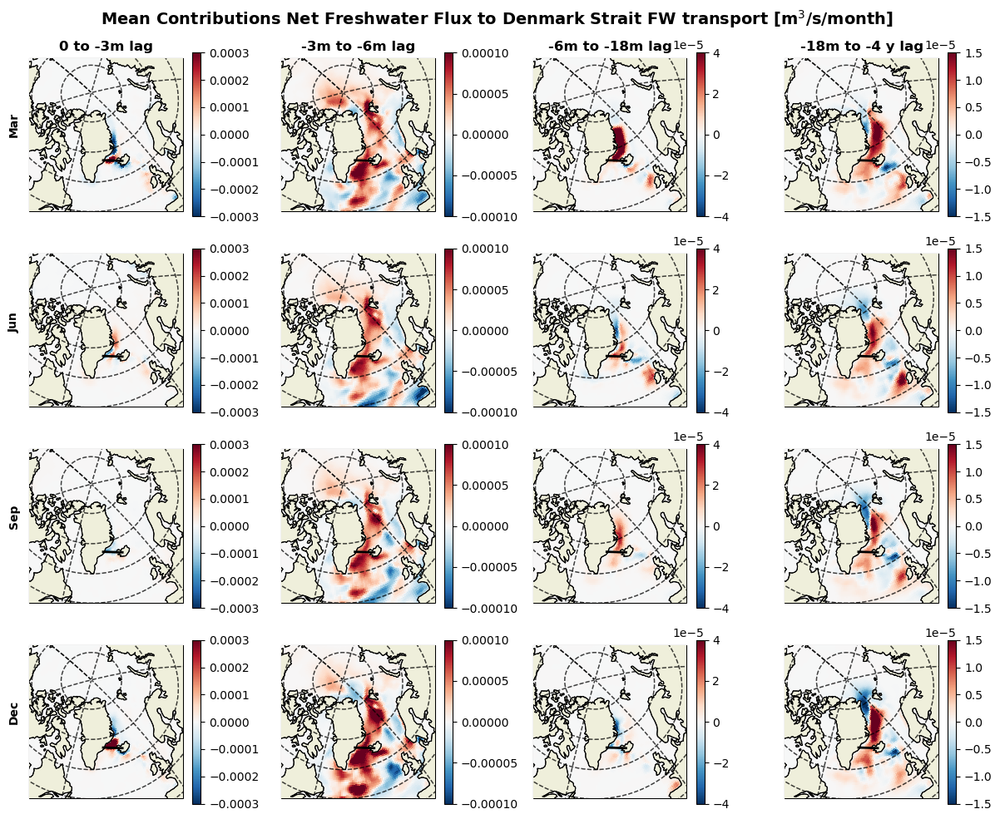

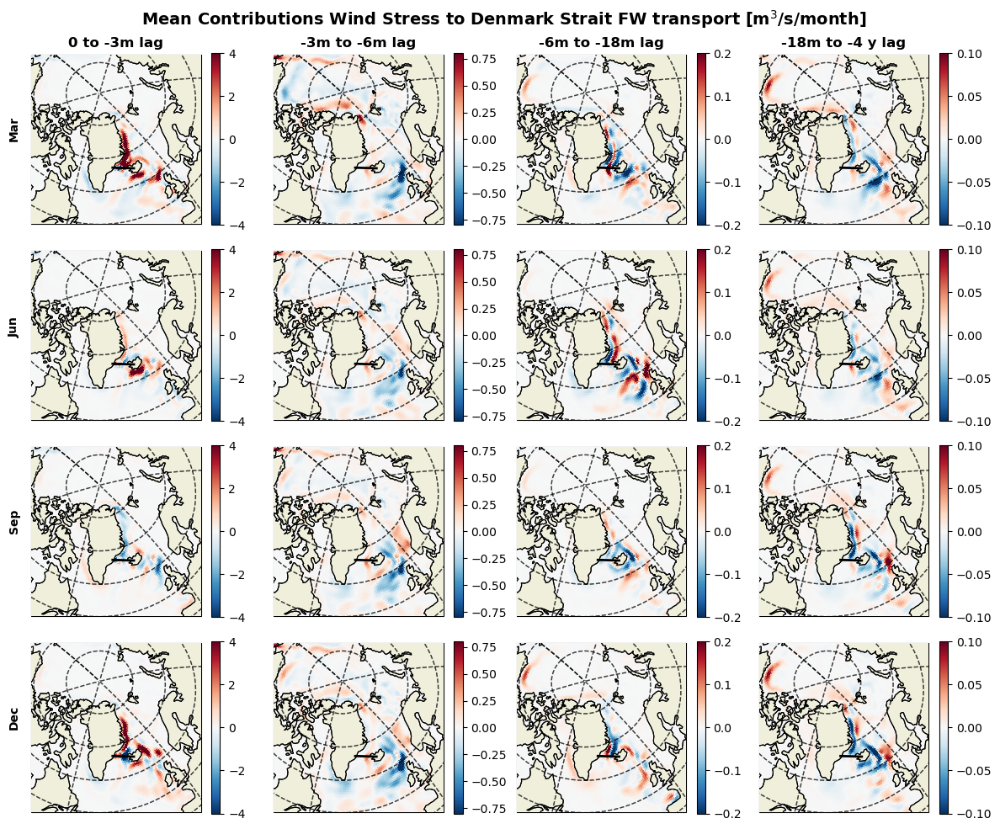

In [21]:
plot_vars=['adxx_qnetXEXFqnet','adxx_empmrXEXFempmr','wind_OCE']
var_label=['adxx_qnet','adxx_empmr','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[12,10])
    pp=1
    for mth in mth_i:
        mth_anom=(ds_plot_all[var].sel(month=mth)).mean('eyear')
        for ilag in range(0,len(lags)-1):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[4,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{mths[int(mth/3)-1]}',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()

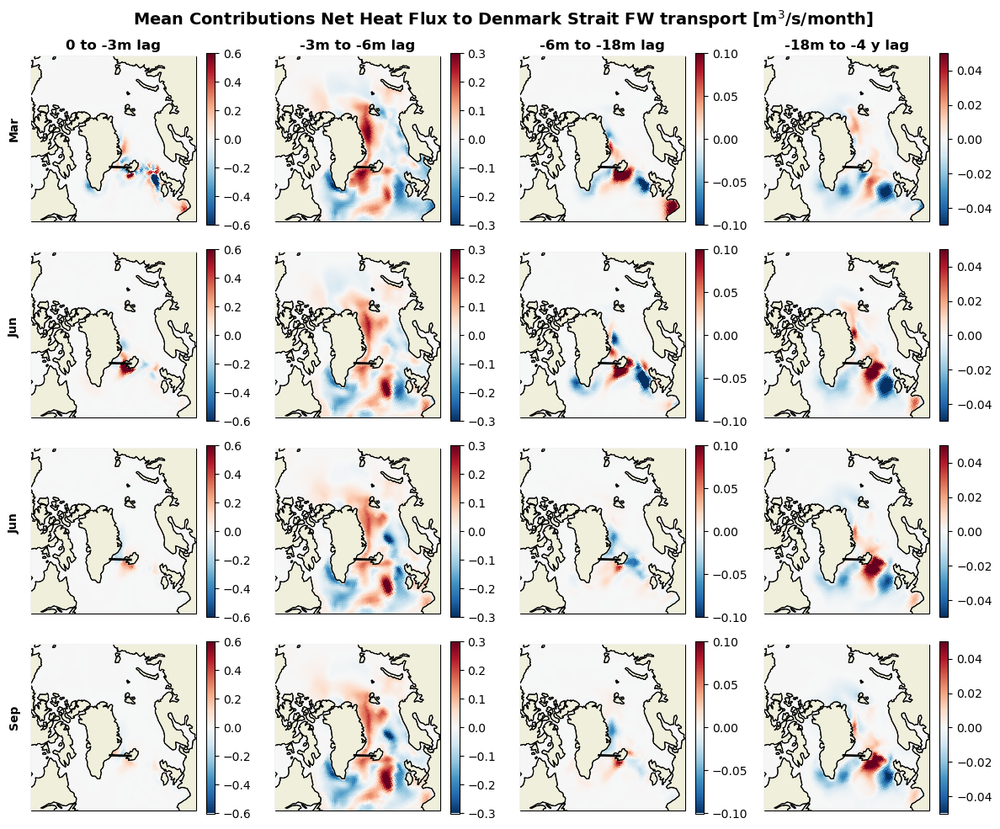

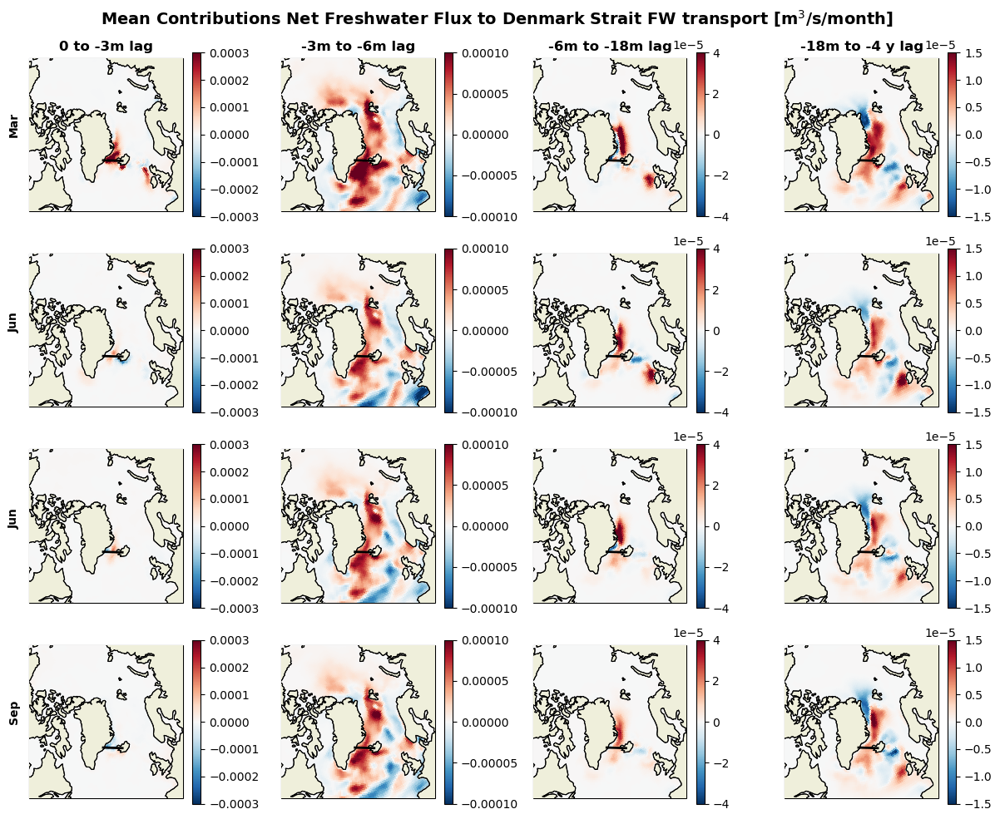

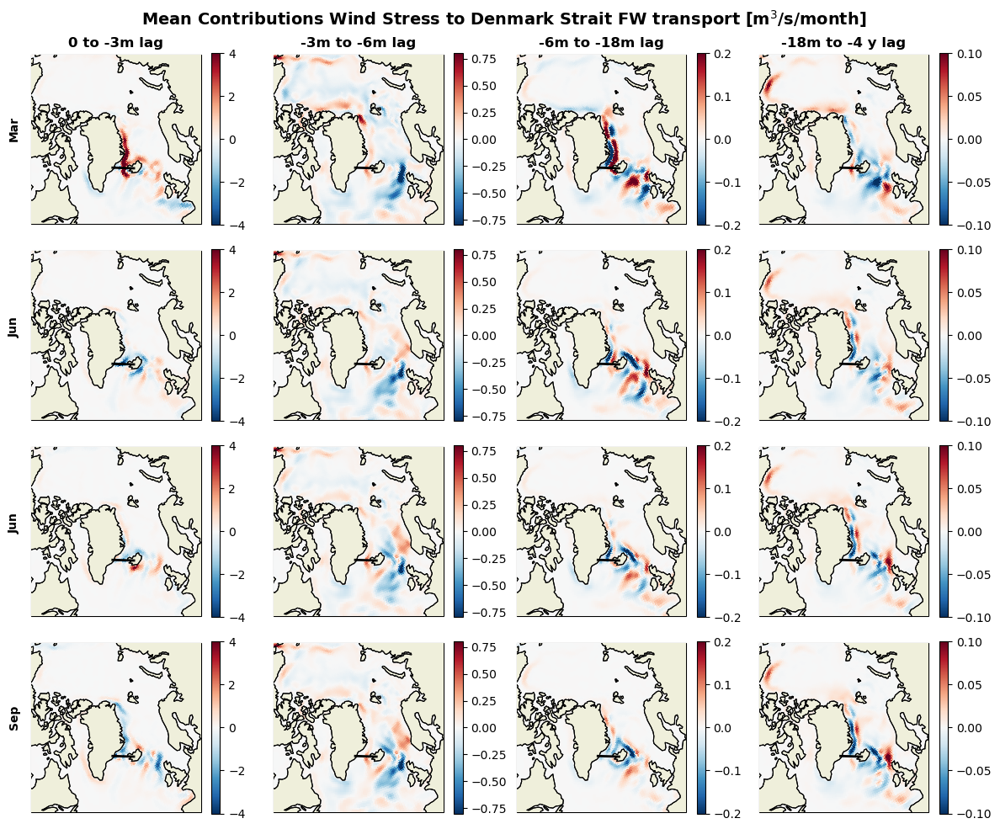

In [6]:
plot_vars=['adxx_qnetXEXFqnet','adxx_empmrXEXFempmr','wind_OCE']
var_label=['adxx_qnet','adxx_empmr','wind_OCE']
for iv,var in enumerate(plot_vars): 
    fig=plt.figure(figsize=[12,10])
    pp=1
    for mth in [4,7,8,9]:
        mth_anom=(ds_plot_all[var].sel(month=mth)).mean('eyear')
        for ilag in range(0,len(lags)-1):
            [f,ax,p]=ut.plot_ecco(ecco_grid,(mth_anom.isel(lag_range=ilag))/(12*lag_lengths[ilag]),subplot_grid=[4,4,pp],
                               **proj_dict,
                               cmin=-clims[var_label[iv]][ilag],cmax=clims[var_label[iv]][ilag]
                              )
            ax.set_extent([xmin,xmax,ymin,ymax], crs=my_projn)
            ax.plot([section_pt1[0],section_pt2[0]],[section_pt1[1],section_pt2[1]],
                 color='k', linewidth=2,transform=ccrs.PlateCarree(),zorder=1000)
            if pp<5:
                plt.title(lag_labels[ilag],fontsize=12,fontweight='bold')
            if ilag==0:
                ax.text(-0.1,0.5,f'{mths[int(mth/3)-1]}',transform=ax.transAxes,rotation='vertical',ha='center',fontweight='bold')
            pp+=1
    plt.suptitle(f'Mean Contributions {exf_labels[var_label[iv]]} to Denmark Strait FW transport [m$^3$/s/month]',fontsize=14,fontweight='bold')
    plt.tight_layout()